[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/Ken-Lau-Lab/MILWRM/blob/main/tutorials/ST_tutorial.ipynb)


Datset to run this notebook can be downloaded from https://www.10xgenomics.com/datasets
In order to use MILWRM's plotting function unfiltered count matrix is required.

In [1]:
import MILWRM as mw
import scanpy as sc
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import harmonypy as hm
from itertools import chain
import matplotlib.gridspec as gridspec
from math import ceil

In [2]:
plt.rcParams["font.family"] = "sans-serif"

In [3]:
import warnings
warnings.filterwarnings("ignore")

read the datasets

In [4]:
mouse_coronal = sc.read("../mouse_data/Mouse_coronal/unfiltered_Mouse_coronal.h5ad")

In [5]:
mouse_coronal_sec_2 = sc.read("../mouse_data/Mouse_coronal_sec_2/unfiltered_Mouse_coronal_sec_2.h5ad")

In [6]:
V1_adult_mouse_brain = sc.read("../mouse_data/V1_Adult_Mouse_brain/unfiltered_V1_Adult_Mouse_brain.h5ad")

In [7]:
V1_saggital = sc.read("../mouse_data/V1_Mouse_brain_saggital/unfiltered_V1_Mouse_brain_saggital_ant.h5ad")

In [8]:
V1_saggital_sec_2 = sc.read("../mouse_data/V1_Mouse_brain_saggital_sec_2/unfiltered_V1_Mouse_brain_saggital_sec_2.h5ad")

In [9]:
V1_saggital_post = sc.read("../mouse_data/V1_Mouse_brain_saggital_post/unfiltered_V1_Mouse_brain_saggital_post.h5ad")

In [10]:
V1_saggital_post_2 = sc.read("../mouse_data/V1_Mouse_brain_saggital_post_sec_2/unfiltered_V1_Mouse_brain_saggital_post_sec_2.h5ad")

## Preprocessing
create a list of datasets

In [11]:
adatas = [mouse_coronal, mouse_coronal_sec_2, V1_adult_mouse_brain, V1_saggital, V1_saggital_sec_2, V1_saggital_post, V1_saggital_post_2]

In [12]:
for adata in adatas:
    adata.var_names_make_unique()

In [13]:
adata_map = []
for adata in adatas:
    adata_map.append(mw.map_pixels(adata)) ## to filter out spots that are not under the tissue helpful with figure creation

Creating pixel grid and mapping to nearest barcode coordinates
Saving barcode mapping to adata.uns['pixel_map_df'] and adding metadata
Filtering barcodes using labels in self.adata.obs['in_tissue']
New size: 2903 spots x 32285 genes
Done!
Creating pixel grid and mapping to nearest barcode coordinates
Saving barcode mapping to adata.uns['pixel_map_df'] and adding metadata
Filtering barcodes using labels in self.adata.obs['in_tissue']
New size: 2807 spots x 32285 genes
Done!
Creating pixel grid and mapping to nearest barcode coordinates
Saving barcode mapping to adata.uns['pixel_map_df'] and adding metadata
Filtering barcodes using labels in self.adata.obs['in_tissue']
New size: 2702 spots x 32285 genes
Done!
Creating pixel grid and mapping to nearest barcode coordinates
Saving barcode mapping to adata.uns['pixel_map_df'] and adding metadata
Filtering barcodes using labels in self.adata.obs['in_tissue']
New size: 2695 spots x 32285 genes
Done!
Creating pixel grid and mapping to nearest b

combining adatas into a bigger adata

In [14]:
labels = ["mouse_coronal", "mouse_coronal_sec_2", "V1_adult_mouse_brain", "V1_saggital", "V1_saggital_sec_2", "V1_saggital_post", "V1_saggital_post_2"]

In [15]:
comb = adata_map[0].concatenate(adata_map[1:],fill_value=0, join="outer", batch_categories = labels)

Performing normalization, scaling and PCA

In [16]:
sc.pp.normalize_total(comb)
sc.pp.log1p(comb)
sc.pp.scale(comb)
sc.pp.pca(comb, n_comps=50)

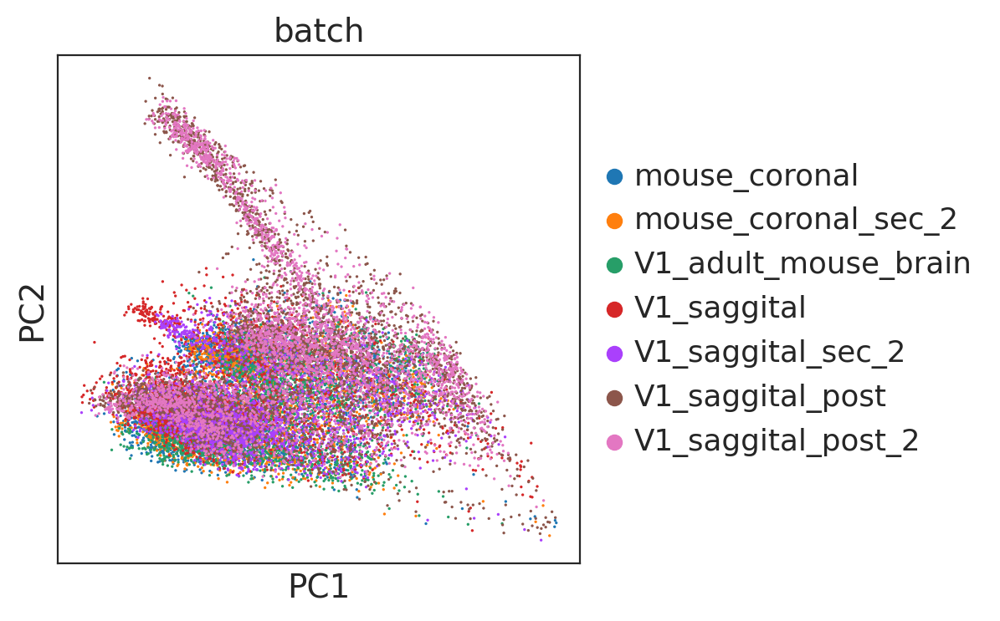

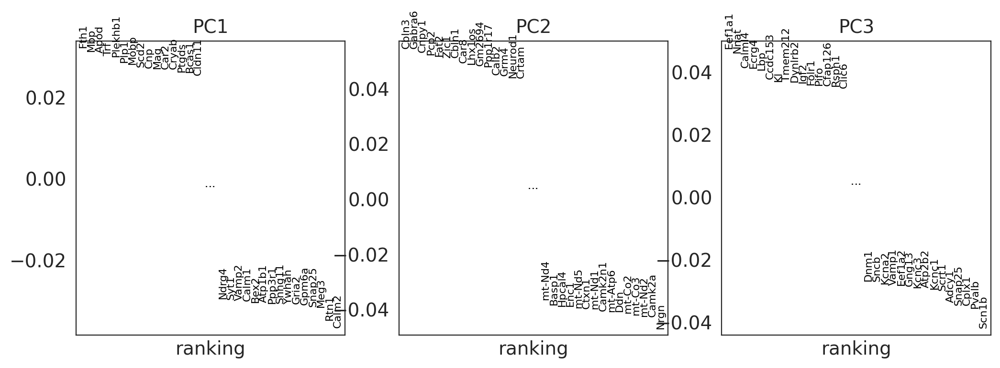

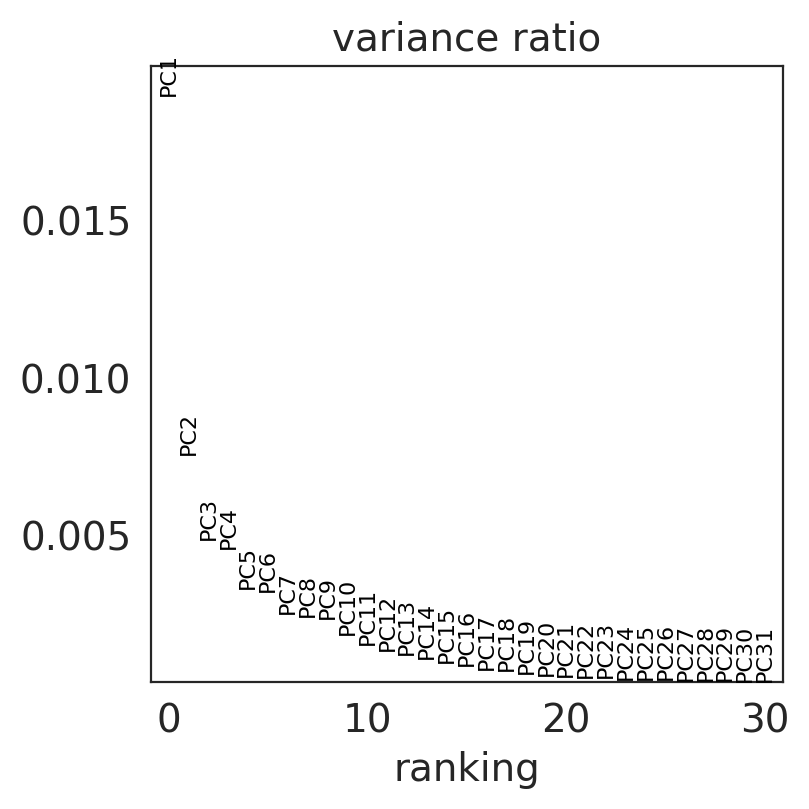

In [17]:
sc.pl.pca_overview(comb, color="batch")

Performing harmony to remove batch effects between samples

In [18]:
top_20_pcs = comb.obsm['X_pca'][:,:20]

In [19]:
meta_data = comb.obs
data_mat = top_20_pcs
data_mat = np.array(data_mat)
vars_use = ['batch']

In [20]:
ho = hm.run_harmony(data_mat, meta_data, vars_use, max_iter_harmony=10)

2023-01-12 17:22:32,156 - harmonypy - INFO - Iteration 1 of 10
2023-01-12 17:22:36,673 - harmonypy - INFO - Iteration 2 of 10
2023-01-12 17:22:41,206 - harmonypy - INFO - Iteration 3 of 10
2023-01-12 17:22:45,724 - harmonypy - INFO - Iteration 4 of 10
2023-01-12 17:22:50,314 - harmonypy - INFO - Iteration 5 of 10
2023-01-12 17:22:54,816 - harmonypy - INFO - Iteration 6 of 10
2023-01-12 17:22:58,965 - harmonypy - INFO - Iteration 7 of 10
2023-01-12 17:23:03,253 - harmonypy - INFO - Converged after 7 iterations


In [21]:
res = pd.DataFrame(ho.Z_corr)
res.columns = ['X{}'.format(i + 1) for i in range(res.shape[1])]

In [22]:
res = res.T

In [23]:
comb.obsm['new_PCA'] = res.values

adding the pre and post harmony PCs back to individual sample adatas 

In [24]:
for i,adata in zip(labels,adata_map):
    adata.obsm['new_PCA'] = comb[comb.obs.batch==str(i),:].obsm['new_PCA']

In [25]:
for i,adata in zip(labels,adata_map):
    adata.obsm['X_pca'] = comb[comb.obs.batch==str(i),:].obsm['X_pca']

## Performing MILWRM
Create the tissue labeler object with adatas

In [26]:
tl = mw.st_labeler(adata_map)

Initiating ST labeler with 7 anndata objects


Here, we perform preprocessing of data. The use_rep parameter determines the representation in adata used for domain detection. 
Features parameter is the list of features from use_rep used for clustering, it is the desired number of PCs in this example. 
n_rings determines the smoothening. 

In [27]:
%time tl.prep_cluster_data(use_rep="new_PCA", features=[0,1,2,3,4,5,6,7,8,9,10,11,12],n_rings=1)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 64 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:   12.3s
[Parallel(n_jobs=-1)]: Done   2 out of   7 | elapsed:   12.5s remaining:   31.4s
[Parallel(n_jobs=-1)]: Done   3 out of   7 | elapsed:   13.2s remaining:   17.5s
[Parallel(n_jobs=-1)]: Done   4 out of   7 | elapsed:   13.4s remaining:   10.0s
[Parallel(n_jobs=-1)]: Done   5 out of   7 | elapsed:   13.4s remaining:    5.3s
[Parallel(n_jobs=-1)]: Done   7 out of   7 | elapsed:   14.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done   7 out of   7 | elapsed:   14.0s finished


Collected clustering data of shape: (20576, 13)
CPU times: user 641 ms, sys: 4.31 s, total: 4.95 s
Wall time: 14.3 s


Here, we perform labeling of tissue regions. The alpha parameter ranges from 0.01 to 0.05 and determines the number of tissue domains. Higher alpha is, lower the number of tissue domains.

Determining optimal cluster number k via scaled inertia


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 64 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 out of  19 | elapsed:    8.3s remaining:  1.2min
[Parallel(n_jobs=-1)]: Done   4 out of  19 | elapsed:    8.4s remaining:   31.3s
[Parallel(n_jobs=-1)]: Done   6 out of  19 | elapsed:    8.5s remaining:   18.5s
[Parallel(n_jobs=-1)]: Done   8 out of  19 | elapsed:    8.7s remaining:   12.0s
[Parallel(n_jobs=-1)]: Done  10 out of  19 | elapsed:    8.8s remaining:    7.9s
[Parallel(n_jobs=-1)]: Done  12 out of  19 | elapsed:    8.9s remaining:    5.2s
[Parallel(n_jobs=-1)]: Done  14 out of  19 | elapsed:    9.0s remaining:    3.2s
[Parallel(n_jobs=-1)]: Done  16 out of  19 | elapsed:    9.1s remaining:    1.7s
[Parallel(n_jobs=-1)]: Done  19 out of  19 | elapsed:    9.3s finished


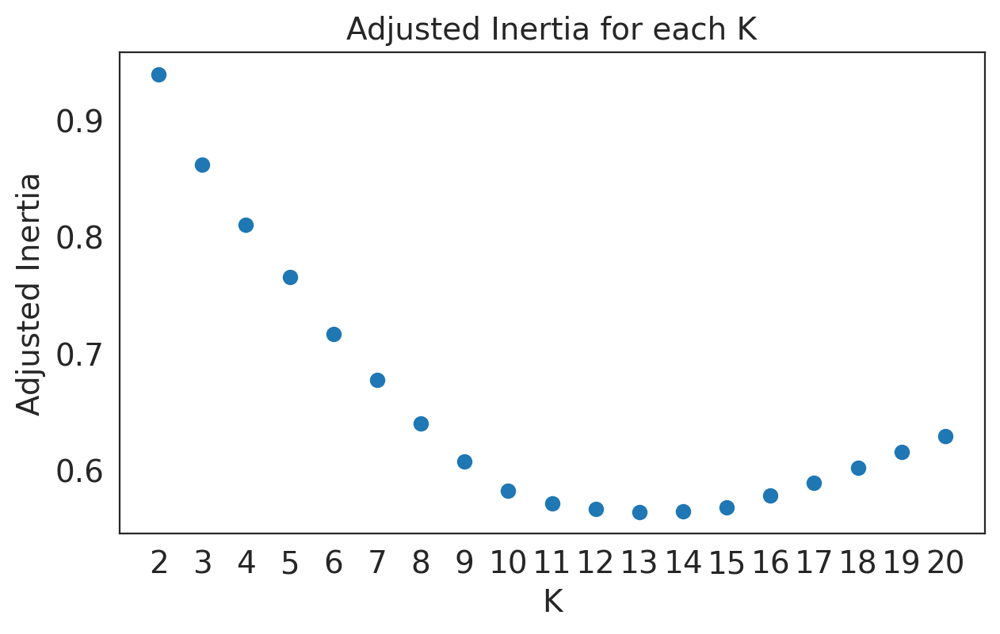

The optimal number of clusters is 13
Performing k-means clustering with 13 target clusters
Adding tissue_ID label to anndata objects
CPU times: user 44.1 s, sys: 3.7 s, total: 47.8 s
Wall time: 10.5 s


In [28]:
%time a = tl.label_tissue_regions(plot_out=True, alpha=0.02)

## Plotting the labelled tissue domains

Assembling pita with 1 features from adata.obs
Casting barcodes to pixel dimensions and saving to adata.uns['pixel_map']
Done!
Assembling pita with 1 features from adata.obs
Casting barcodes to pixel dimensions and saving to adata.uns['pixel_map']
Done!
Assembling pita with 1 features from adata.obs
Casting barcodes to pixel dimensions and saving to adata.uns['pixel_map']
Done!
Assembling pita with 1 features from adata.obs
Casting barcodes to pixel dimensions and saving to adata.uns['pixel_map']
Done!
Assembling pita with 1 features from adata.obs
Casting barcodes to pixel dimensions and saving to adata.uns['pixel_map']
Done!
Assembling pita with 1 features from adata.obs
Casting barcodes to pixel dimensions and saving to adata.uns['pixel_map']
Done!
Assembling pita with 1 features from adata.obs
Casting barcodes to pixel dimensions and saving to adata.uns['pixel_map']
Done!


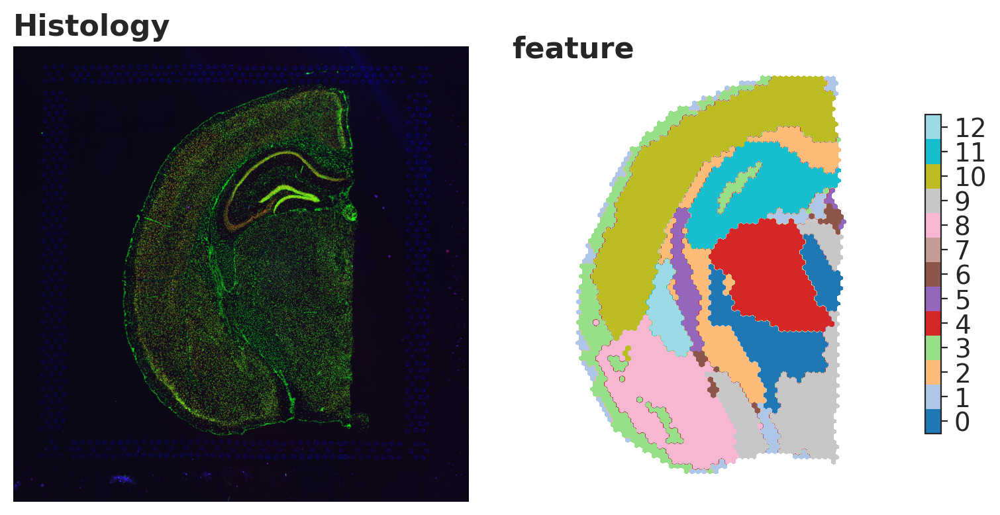

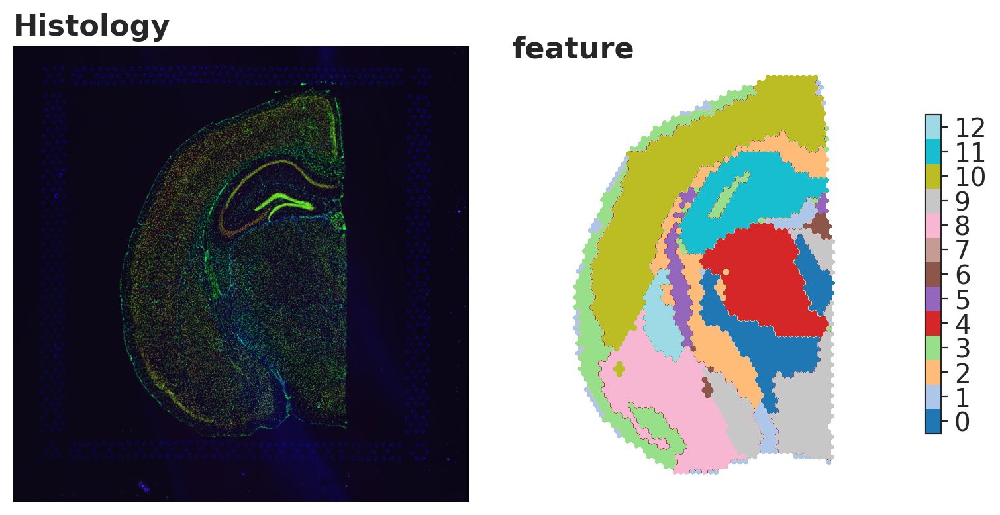

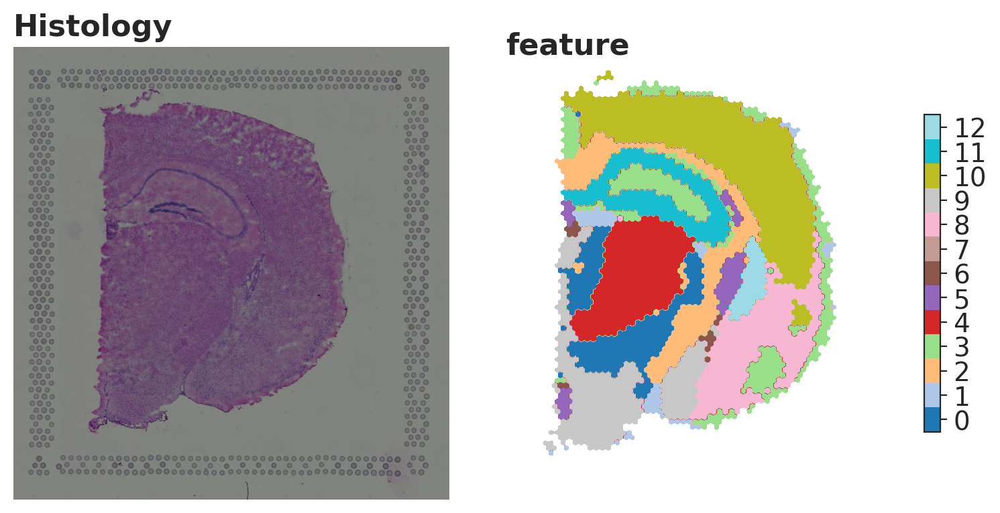

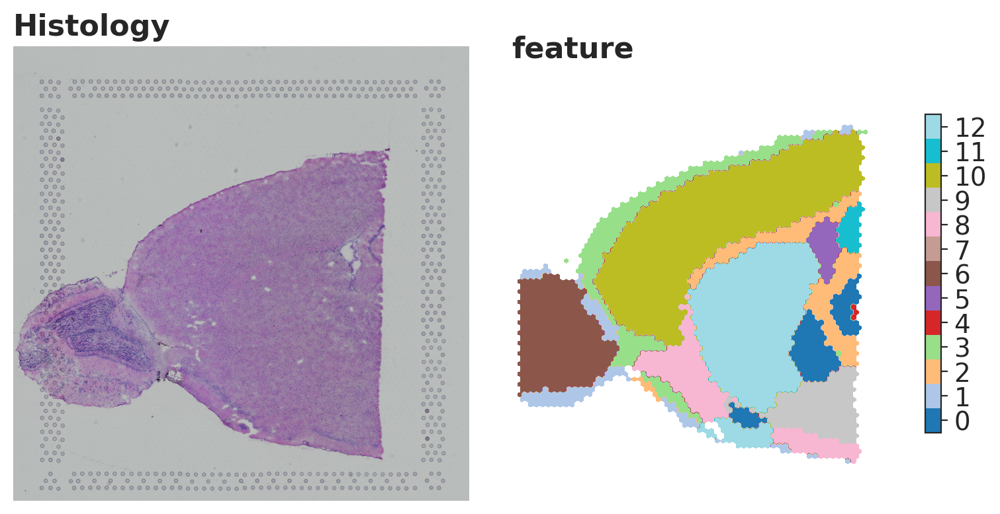

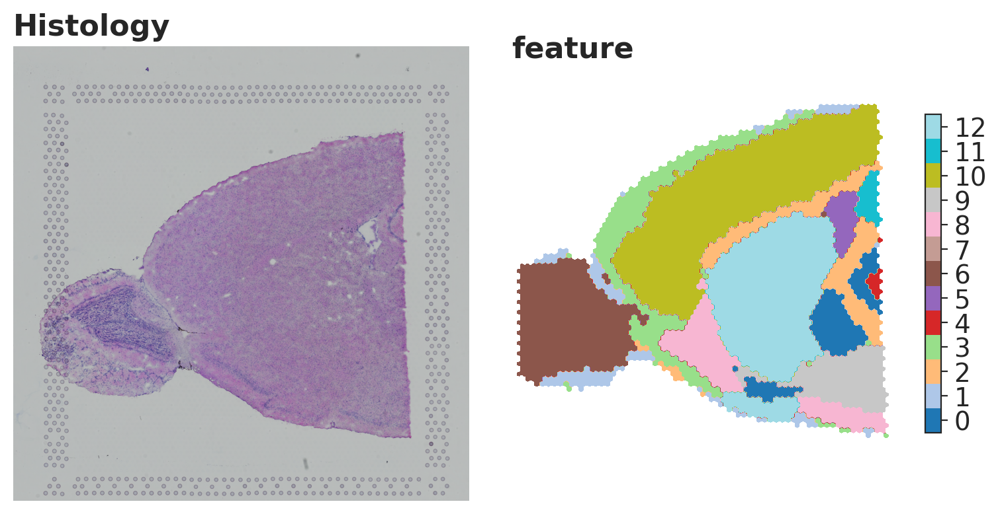

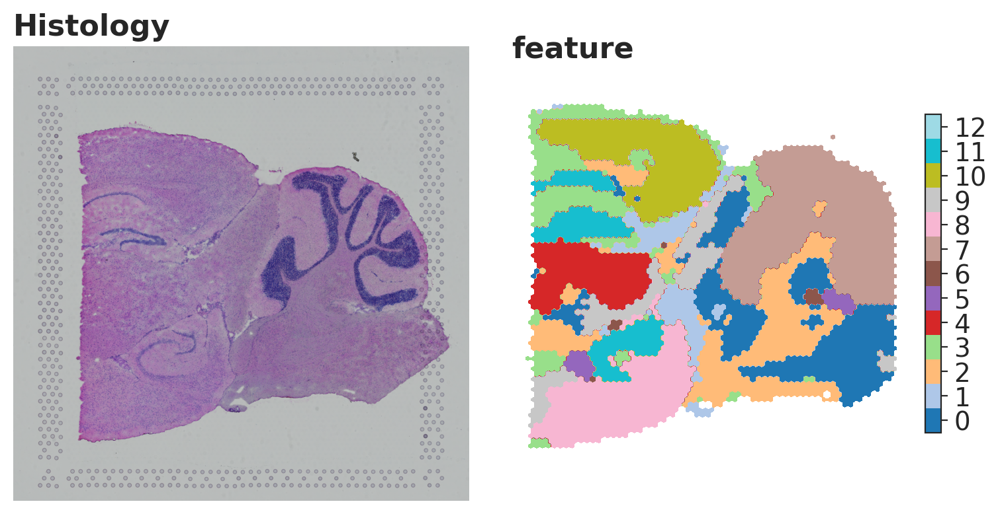

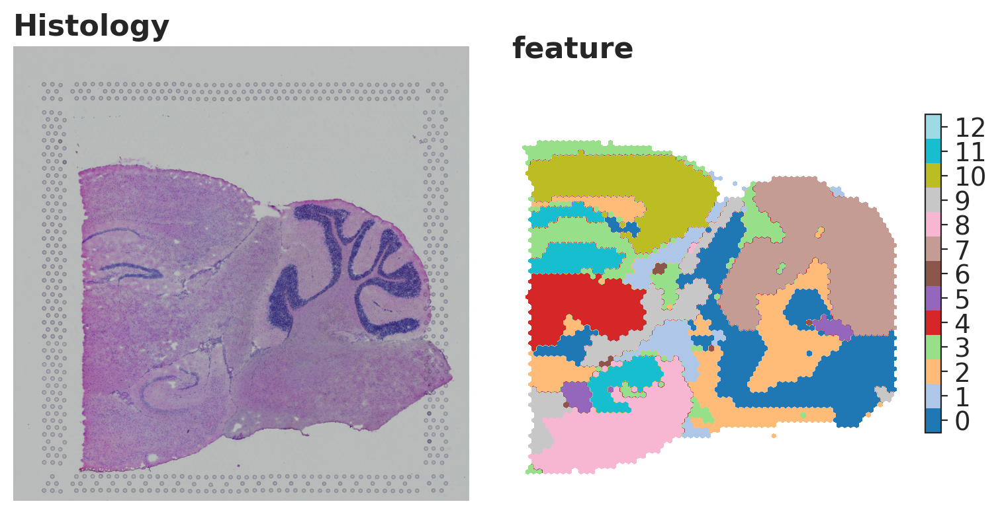

In [29]:
for i in range(len(tl.adatas)):
    # get blurred features that are saved to adata.obs
    # create plot of blurred training features and final tissue_ID labels
    p = mw.assemble_pita(tl.adatas[i], use_rep = ".obs",features=['tissue_ID'], histo = 'hires',cmap = 'tab20', save_to = None)

## Additional features
plotting domain profiles in gene space

GridSpec(5, 3)

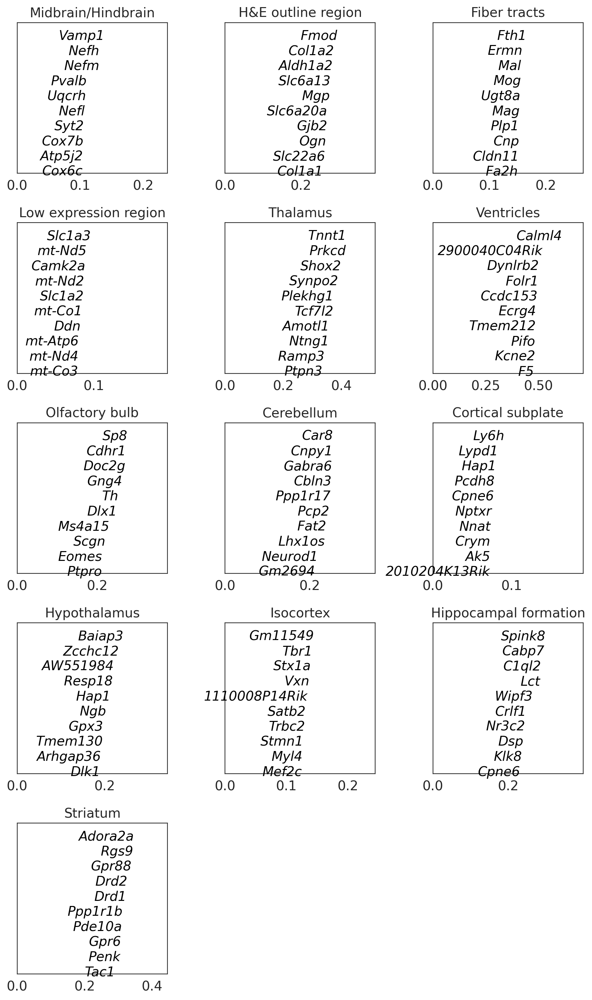

In [30]:
tl.plot_gene_loadings(comb.varm['PCs'], ncols = 3, titles = ['Midbrain/Hindbrain'
                                                            , 'H&E outline region'
                                                            , 'Fiber tracts'
                                                            , 'Low expression region'
                                                            , 'Thalamus'
                                                            , 'Ventricles'
                                                            , 'Olfactory bulb'
                                                            , 'Cerebellum'
                                                            , 'Cortical subplate'
                                                            , 'Hypothalamus'
                                                            , 'Isocortex'
                                                            , 'Hippocampal formation'
                                                            , 'Striatum']
                     , save_to= None)

estimating and plotting confidence scores 

In [31]:
tl.confidence_score()

Assembling pita with 1 features from adata.obs
Casting barcodes to pixel dimensions and saving to adata.uns['pixel_map']
Done!
Assembling pita with 1 features from adata.obs
Casting barcodes to pixel dimensions and saving to adata.uns['pixel_map']
Done!
Assembling pita with 1 features from adata.obs
Casting barcodes to pixel dimensions and saving to adata.uns['pixel_map']
Done!
Assembling pita with 1 features from adata.obs
Casting barcodes to pixel dimensions and saving to adata.uns['pixel_map']
Done!
Assembling pita with 1 features from adata.obs
Casting barcodes to pixel dimensions and saving to adata.uns['pixel_map']
Done!
Assembling pita with 1 features from adata.obs
Casting barcodes to pixel dimensions and saving to adata.uns['pixel_map']
Done!
Assembling pita with 1 features from adata.obs
Casting barcodes to pixel dimensions and saving to adata.uns['pixel_map']
Done!


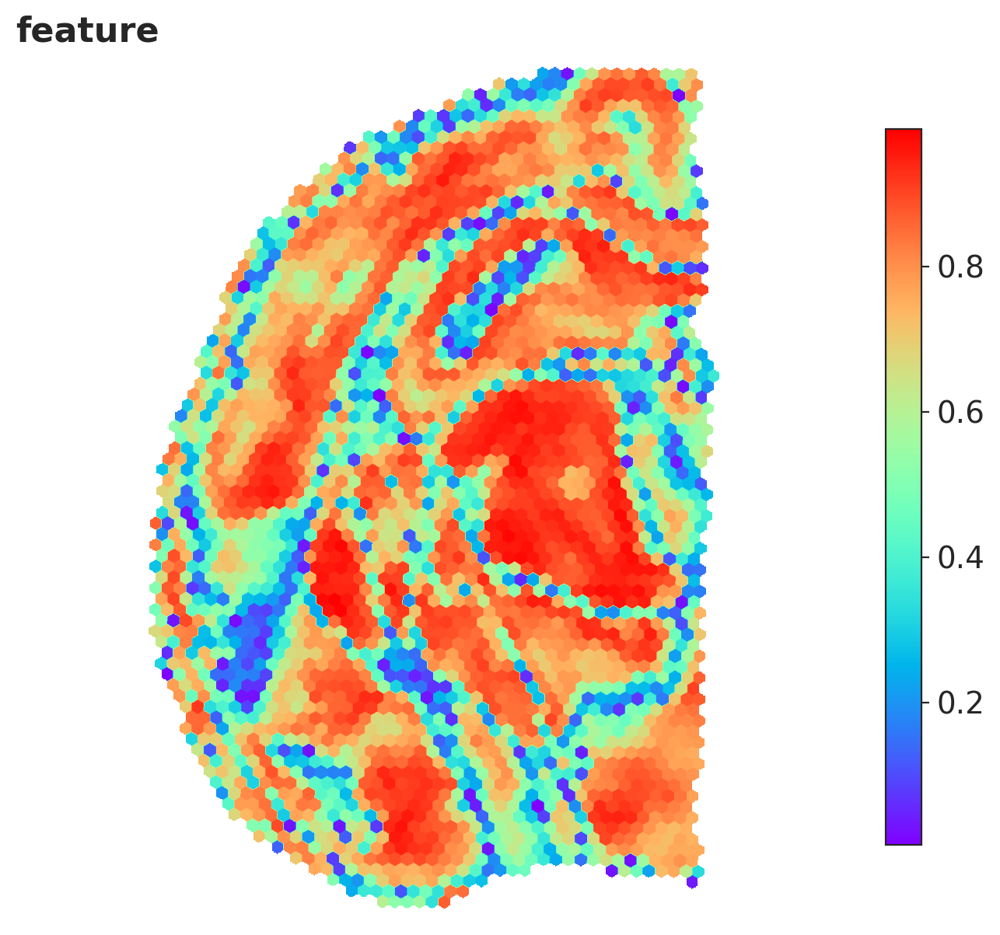

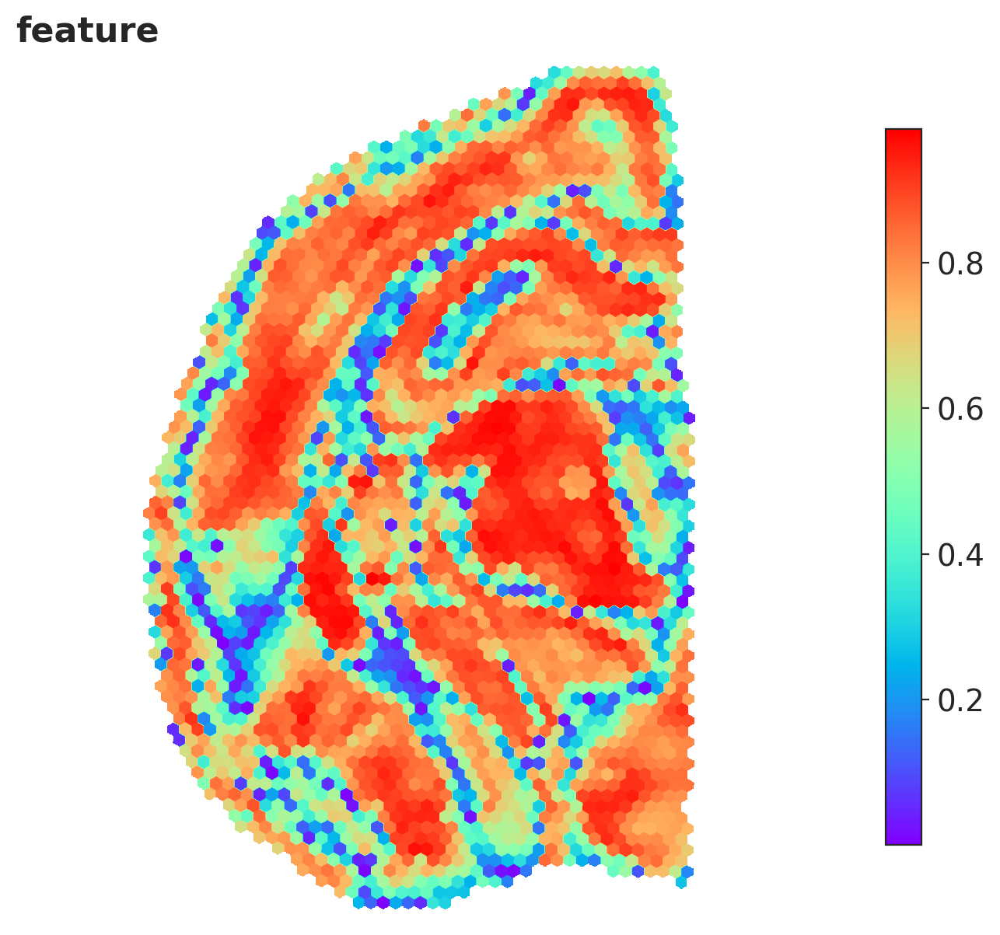

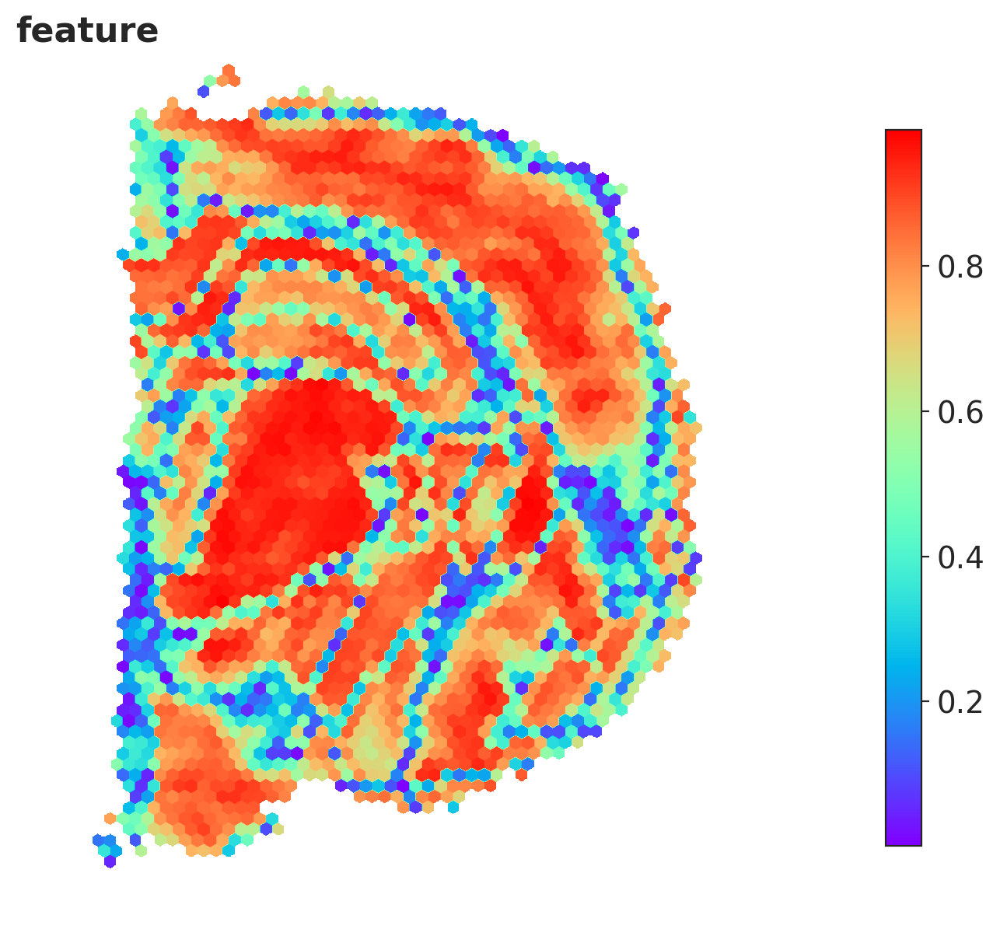

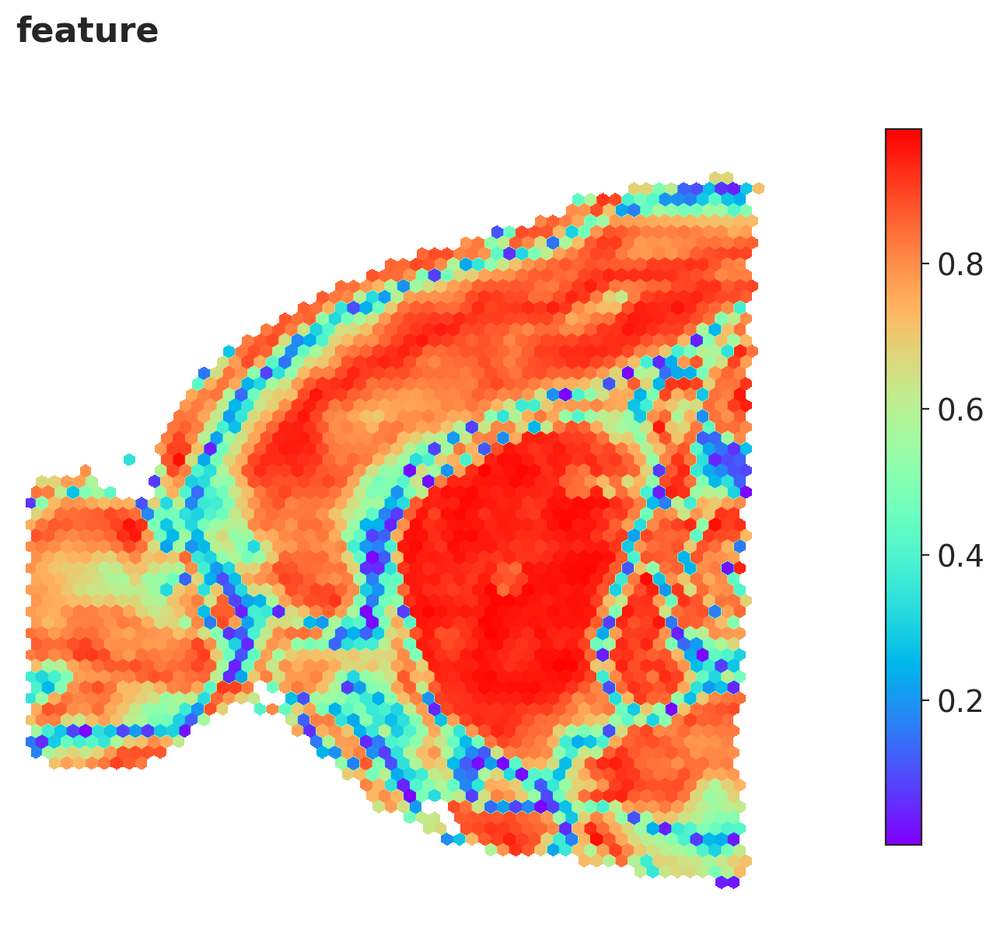

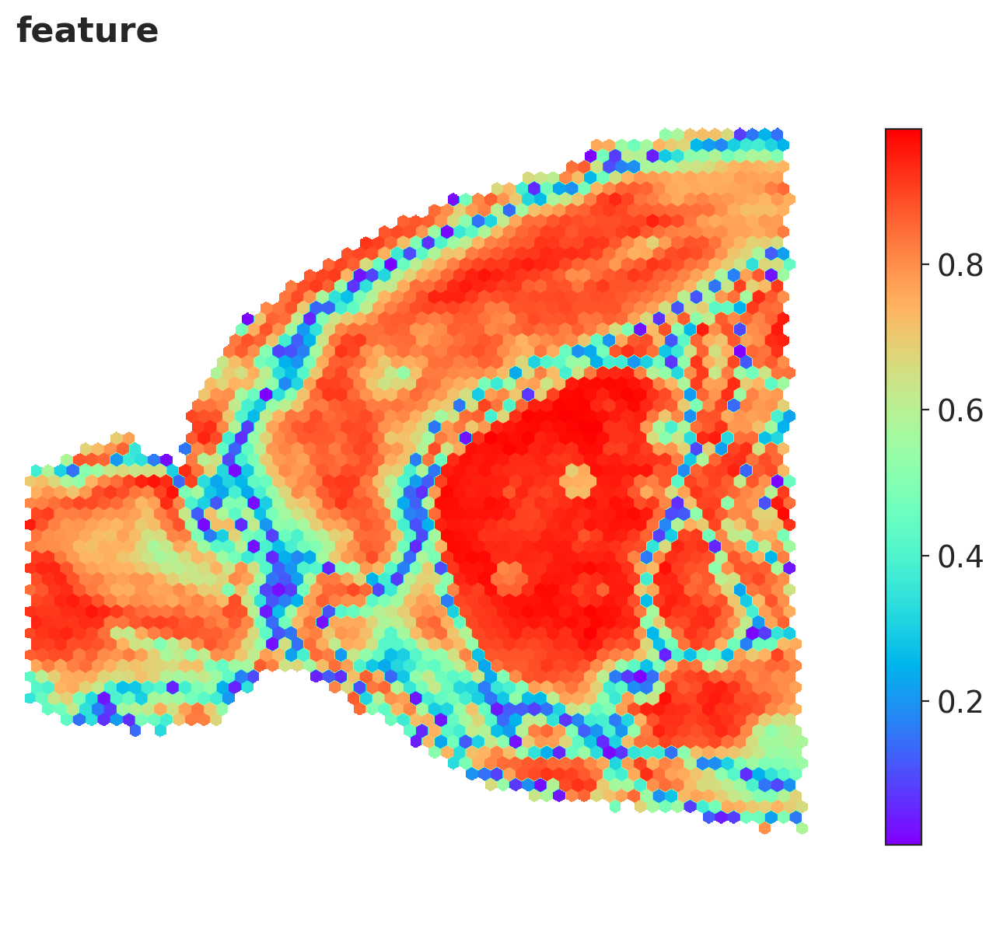

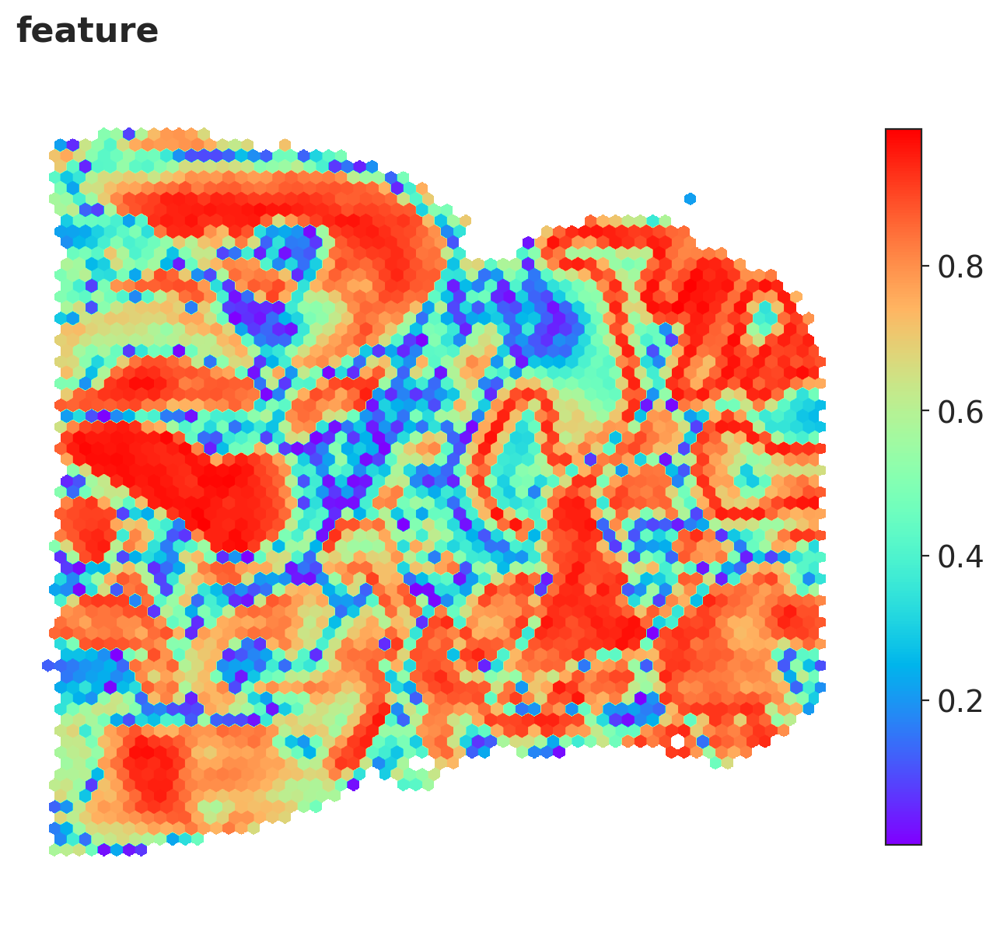

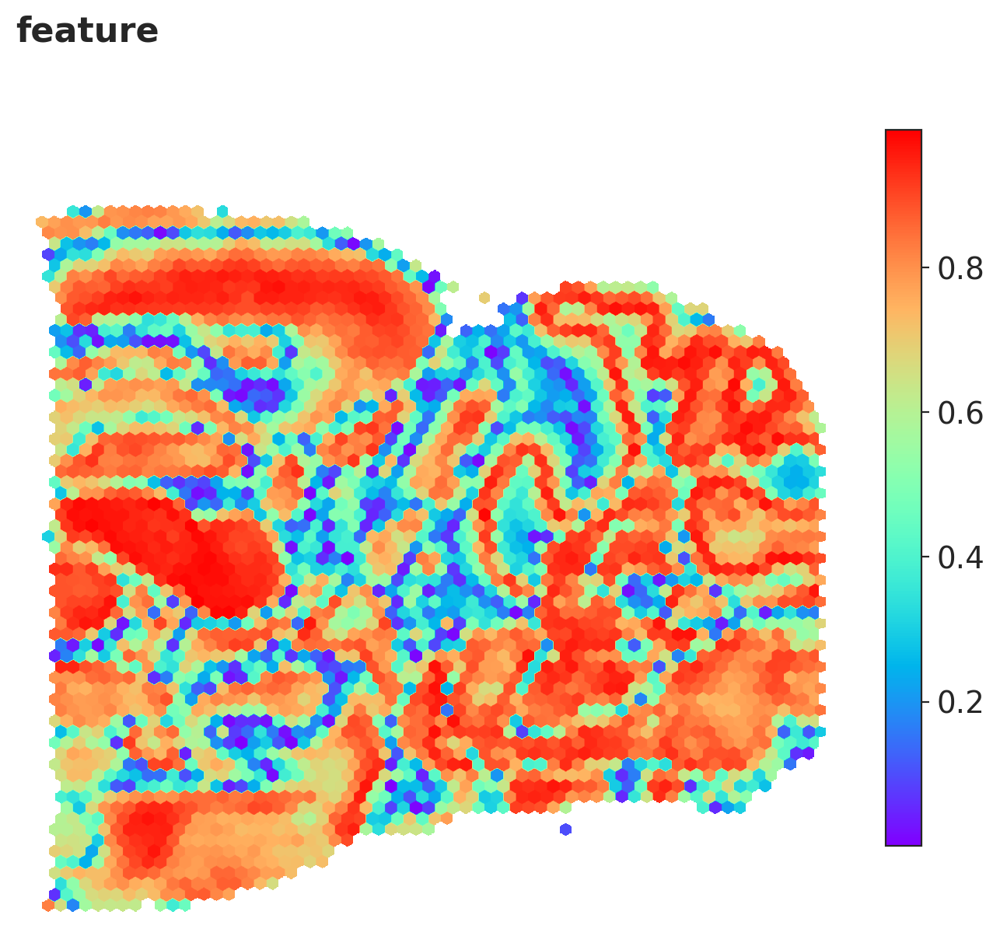

In [32]:
for i in range(len(tl.adatas)):
    # a = sc.pl.spatial(tl.adatas[i],color = "n_confidence_score" )
    p = mw.assemble_pita(tl.adatas[i], use_rep = ".obs",features=['confidence_score'],cmap = 'rainbow', save_to = None)

plotting variance explained by the kmeans model

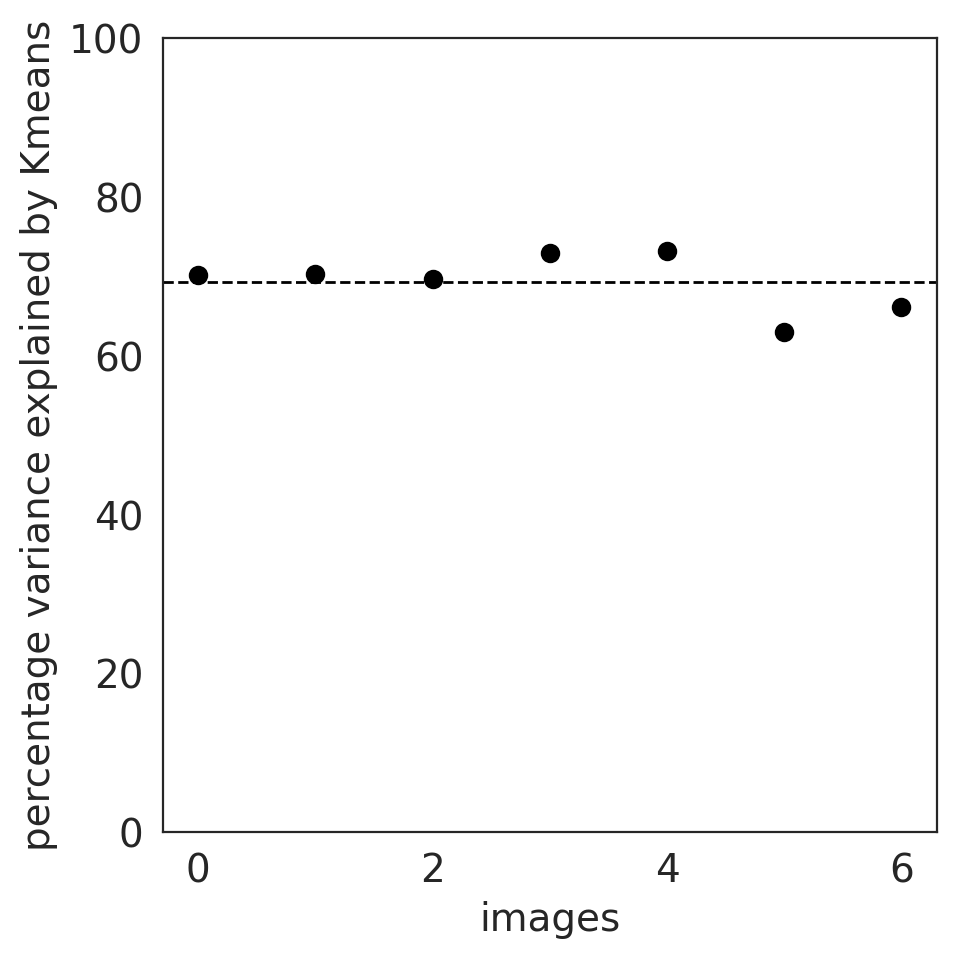

In [33]:
a = tl.plot_percentage_variance_explained(R_square= True, save_to= None)

plotting mean square error within each tissue domain

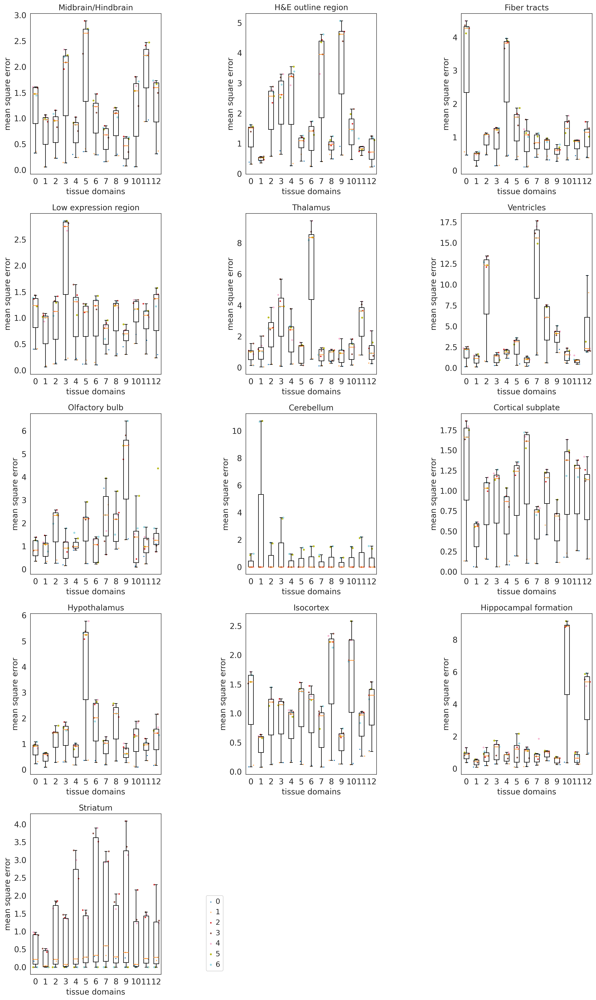

In [34]:
a = tl.plot_mse_st(ncols= 3,titles= ['Midbrain/Hindbrain'
                                                            , 'H&E outline region'
                                                            , 'Fiber tracts'
                                                            , 'Low expression region'
                                                            , 'Thalamus'
                                                            , 'Ventricles'
                                                            , 'Olfactory bulb'
                                                            , 'Cerebellum'
                                                            , 'Cortical subplate'
                                                            , 'Hypothalamus'
                                                            , 'Isocortex'
                                                            , 'Hippocampal formation'
                                                            , 'Striatum'] ,save_to= None)

plotting proportion of each tissue domain

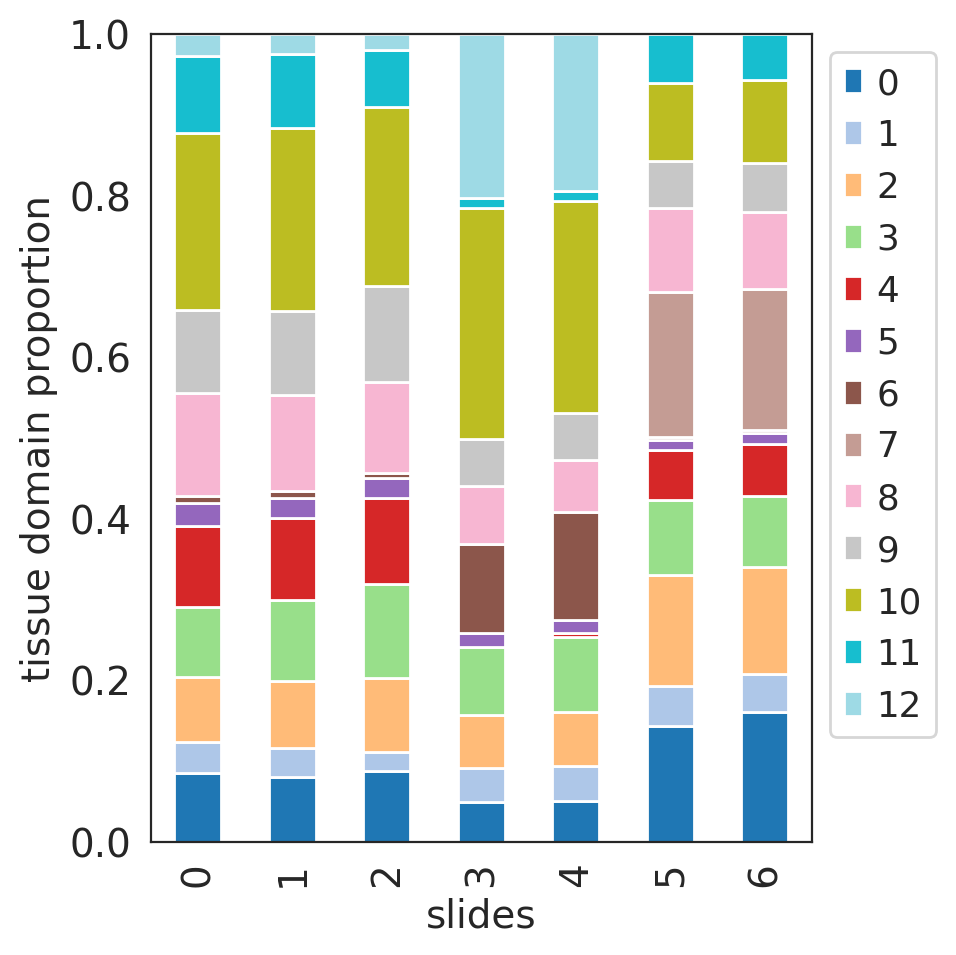

In [35]:
a = tl.plot_tissue_ID_proportions_st(save_to="4C.png")